## Find VK groups with common subscribers  
We've already got **users ids** for the main VK group «Подслушано – здесь говорят о тебе» and need to return their subscriptions (with threshold for number of participants from 100k to 500k).

In [2]:
from tqdm import tqdm
import pickle
import requests
import json
import time
import logging
from itertools import chain
from collections import Counter
import csv
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

In [3]:
def from_pickle(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)

In [4]:
#users ids we'll iterate over
users_id_list = from_pickle('source/alive_users_only_id.pkl')
print('Количество id пользователей:', len(users_id_list))

#access token for VK API
with open('source/save_access_token.txt', 'r') as f: 
    access_token = f.read()

Количество id пользователей: 2507444


In [5]:
users_id_list[:12]

[177, 243, 345, 397, 431, 441, 479, 588, 717, 794, 831, 931]

In [22]:
#logger
with open('source/path_for_logger.txt', 'r') as f:
    logger_path = f.read()

LOG_FORMAT = '%(message)s'
LOG_FNAME = logger_path

logging.basicConfig(filename=LOG_FNAME, 
                    level=logging.ERROR, 
                    format=LOG_FORMAT,
                    filemode='w')

logger = logging.getLogger('logger')

In [59]:
#offsets
def set_offset(user_id):
    '''
    takes in users id, make request via VK API and 
    count the number of offsets (all items // 1000),
    returns count
    '''
    count = requests.get(f'https://api.vk.com/method/groups.get?user_id={user_id}&extended=1&fields=members_count,activity&offset=0&access_token={access_token}&v=5.130').json()['response']['count'] 
    return count // 1000

#collecting groups ids
def collect_groups(user_id, bottom_line, upper_bound):
    '''
    takes in users id, access token for VK API,
    bottom and upper bound for the number of group users, 
    appply get_offset function, chek if group isn't deactivated,
    and returns list with active groups'
    '''
    active_groups = []
    offset = 0
    max_offset = set_offset(user_id)
    while offset <= max_offset:
        response = requests.get(f'https://api.vk.com/method/groups.get?user_id={user_id}&extended=1&fields=members_count,activity&offset={offset}&count=1000&access_token={access_token}&v=5.130').json()['response']
        offset += 1
        
        for item in response['items']:
            try:
                c = item['members_count']
                if bottom_line < c < upper_bound and 'deactivated' not in item:
                    active_groups.append(item['id'])
            except Exception as E:
                continue
                
    return active_groups

#saving data at specific iteraton
def to_pickle(data):
    with open(f'autosave/{len(data)-100000}-{len(data)}.pickle', 'wb') as f:
        return pickle.dump(data, f)

In [67]:
#set users number limits for groups
bottom_line, upper_bound = 100000, 500000

#all_groups = {}
for user_id in tqdm(users_id_list[1929624:], position=0, leave=True):
    try:
        group = collect_groups(user_id, bottom_line, upper_bound)
        time.sleep(1)

    except KeyError as err:
        logger.error(user_id)
        
    all_groups[f'{user_id}'] = group
    
    if len(all_groups)%100000 == 0:
        to_pickle(all_groups)
        
with open(f'prep_data/groups_{bottom_line}-{upper_bound}_thr.pickle', 'wb') as f:
    pickle.dump(all_groups, f)

100%|██████████| 577820/577820 [10:47:29<00:00, 14.87it/s]   


## Make pairs from groups ids

In [4]:
all_groups = from_pickle('prep_data/groups_100000-500000_thr.pickle')

In [ ]:
def make_pairs(dictionary):
    '''
    takes in dictionary with lists of each user's groups as value,
    iterate over lists and returns all possible pairs
    '''
    all_possible_pairs = []
    for val in tqdm(dictionary.values()):
        if val:
            pair_subset = ([(min(val[i], val[j]), 
                             max((val[i], val[j]))) 
                             for i in range(len(val)) 
                             for j in range(i+1, len(val))])
            
        all_possible_pairs.extend(pair_subset)
    print('Количество всех возможных пар:', len(all_possible_pairs))
    return all_possible_pairs

def count_pairs(all_possible_pairs):
    '''
    takes in a list with all possible pairs and 
    returns a set of these pairs and their counts 
    from the most common to the least
    '''
    counts = Counter(all_possible_pairs).most_common()
    print('Количество всех возможных пар:',len(all_possible_pairs))
    print('Количество уникальных пар:',len(counts))
    
    return counts

def make_df(counts):
    '''
    takes in a list of the all elements and their counts,
    extract nested tuples and returns DataFrame
    '''
    unpacked = [(x, y, z) for ((x, y), z) in counts]
    df_nodes = pd.DataFrame(unpacked, columns=['node1', 'node2', 'weight'])
    print('Количество пар вершин (ребер):',df_nodes.shape[0])
    
    return df_nodes

def main():
    all_possible_pairs = make_pairs(all_groups)
    counts = count_pairs(all_possible_pairs)
    df_nodes = make_df(counts)
    df_nodes.to_pickle(f'prep_data/groups_counter_{df_nodes.shape[0]}.pickle')

if __name__ == '__main__':
    main()

 52%|█████▏    | 1307071/2507441 [1:27:31<11:22, 1759.17it/s]   

In [26]:
print('Количество пар вершин (ребер):',df_nodes.shape[0])

Количество пар вершин (ребер): 26096980


In [24]:
#df_nodes.to_pickle('prep_data/groups_counter_df.pickle')

## Getting extra info about VK groups

In [3]:
df_nodes = pd.read_pickle('prep_data/groups_counter_df.pickle')

In [123]:
#groups_set = set(df_nodes.node1.values + df_nodes.node2.values)
groups_set = set(df_nodes.node1) | set(df_nodes.node2) 
print('Количество уникальных групп:', len(groups_set))

Количество уникальных групп: 17202


In [156]:
def divide_chunks(l, n):  
    #looping till length l
    for i in range(0, len(l), n): 
        yield ','.join(l[i:i + n])

def get_groups_ids(df_nodes):
    groups_set = set(df_nodes.node1) | set(df_nodes.node2)
    print('Количество уникальных групп:', len(groups_set))
    
    #make str idies for request
    groups_set_str = [str(i) for i in list(groups_set)]
    
    #make string by 500 elements devided by ,
    groups_set_500 = []
    for i in divide_chunks(list(groups_set_str), 500):
        groups_set_500.append(i)
    print('Количество запросов по 500 group_ids:',len(groups_set_500))
    
    return groups_set_500

In [160]:
#access token for VK API
with open('source/save_access_token.txt', 'r') as f: 
    access_token = f.read()

#saving data at specific iteraton
def to_pickle_ids(data):
    with open(f'autosave/desc_{n_iter}.pickle', 'wb') as f:
        return pickle.dump(data, f)
    
def get_groups_info(group_id):
    '''takes in groups ids and returns info about theese groups via VK API
    '''
    groups_info = []

    response = requests.get(f'https://api.vk.com/method/groups.getById',params={
        'group_ids':group_id,
        'fields':'name,type,activity,members_count',
        'access_token':access_token,
        'v':'5.130'
    }).json()['response']
    n_iter = 0
    for item in response:
        try:
            id_group = item['id']
            group_name = item['name']
            group_type = item['type']
            group_activity = item['activity']
            group_members_count = item['members_count']
            
            group_dict = {
            'group_id':id_group,
            'name':group_name,
            'type':group_type,
            'activity':group_activity,
            'members':group_members_count}
                
            groups_info.append(group_dict)
            
            if n_iter%1000==0:
                to_pickle_ids(groups_info)
            
                
        except Exception as E:
            continue
        n_iter += 1
                
    return groups_info

#logger settings
with open('source/path_for_group_desc_logger.txt', 'r') as f:
    path = f.read()

LOG_FORMAT = '%(message)s'
LOG_FNAME = 'groups_logger.log'

logging.basicConfig(filename = LOG_FNAME, 
                    level = logging.ERROR, 
                    format = LOG_FORMAT,
                    filemode = 'w')

logger = logging.getLogger('logger')


def main():
    ids = get_groups_ids(df_nodes)
    
    groups_info = []
    for group_id in tqdm(ids, position=0, leave=True):
        try:
            group_ok = get_groups_info(group_id)
            time.sleep(1)

        except KeyError as err:
            logger.error(group_ok)
       
        groups_info.append(group_ok)
    
    all_groups_info = list(chain(*groups_info))
    print('Количество скачанных id групп:', len(groups_info_))
    
    with open('prep_data/get_groups_info_dict.pickle', 'wb') as f:
        pickle.dump(all_groups_info, f)

if __name__ == '__main__':
    main()

  0%|          | 0/35 [00:00<?, ?it/s]

Количество уникальных групп: 17202
Количество запросов по 500 group_ids: 35


100%|██████████| 35/35 [00:49<00:00,  1.42s/it]

Количество скачанных id групп: 17202


## From dictionary to DataFrame

In [161]:
with open('prep_data/get_groups_info_dict.pickle', 'rb') as f:
    all_groups_info = pickle.load(f)

In [163]:
df_desc = pd.DataFrame(groups_info_)

In [164]:
#check duplicated elements
dup = df_desc[df_desc.duplicated()]
dup_id = df_desc[df_desc.duplicated(['group_id'])]
dup_name = df_desc[df_desc.duplicated(['name'])]
print('Количество полных дупликатов:',len(dup))
print('Количество дупликатов id групп:',len(dup_id))
print('Количество дупликатов названий групп:',len(dup_name))

Количество полных дупликатов: 0
Количество дупликатов id групп: 0
Количество дупликатов названий групп: 945


In [165]:
def remove_dupl(groups_desc_df):
    '''
    takes in table with groups description, renames 
    duplicated groups names and returns a new table
    '''
    duplicated = groups_desc_df[groups_desc_df.duplicated(['name'])]
    print('Количество одинаковых названий групп:',len(duplicated))
    
    #set names as index
    df = groups_desc_df.set_index('name')
    #find duplicated names and remove of duplicated index to unique (group, group1, group2...)
    df.index = df.index + df.groupby(level=0).cumcount().astype(str).replace('0','')
    df.to_pickle('prep_data/groups_desc_drop_dupl.pickle')

    return df
if __name__ == '__main__':
    groups_desc = remove_dupl(df_desc)
    print('Дупликатов названий групп после чистки:',
          len(groups_desc[groups_desc.index.duplicated]))

Количество одинаковых названий групп: 945
Дупликатов названий групп после чистки: 0


In [166]:
groups_desc

,group_id,type,activity,members
ВКонтакте API,1,group,Открытая группа,383309
ILY 27,67829766,page,Юмор,266537
Психология,11,group,Открытая группа,306786
Медицинские байки,160301073,page,Медицина,207488
пикчи для переговоров,183238673,page,Юмор,182635
...,...,...,...,...
GAYAZOV$ BROTHER$,26607605,page,Музыкальная группа,335824
Отечественный автопром,129368054,page,Автомобили,100800
ShadowPriestok - Официальная Группа,45744117,page,Блогер,182323
Клуб рукодельниц - своими руками,107151352,page,Творчество,182825


## Match groups pairs and groups description

In [3]:
groups_desc = pd.read_pickle('prep_data/groups_desc_drop_dupl.pickle')
groups_pairs = pd.read_pickle('prep_data/groups_counter_df.pickle')

In [10]:
groups_desc = groups_desc.reset_index().rename(columns={'index':'name'})

In [11]:
groups_desc.head(4)

,name,group_id,type,activity,members
0,ВКонтакте API,1,group,Открытая группа,383309
1,ILY 27,67829766,page,Юмор,266537
2,Психология,11,group,Открытая группа,306786
3,Медицинские байки,160301073,page,Медицина,207488


In [12]:
groups_pairs.head(4)

,node1,node2,weight
0,11766299,25403377,937549
1,11766299,25008403,937486
2,25008403,25403377,937486
3,11766299,16108331,937451


In [15]:
groups_merged = (pd.merge(left=groups_pairs, 
                          right=groups_desc[['group_id','members','name']],
                          left_on='node1', how='left', 
                          right_on='group_id')
                          .rename(columns={'members':'members1','name':'name1'})
                          .drop(columns='group_id'))

groups_merged = (pd.merge(left=groups_merged, 
                          right=groups_desc[['group_id','members','name']],
                          left_on='node2', how='left', 
                          right_on='group_id')
                          .rename(columns={'members':'members2','name':'name2'})
                          .drop(columns='group_id'))

In [17]:
groups_merged['members_sum'] = groups_merged.members1 + groups_merged.members2
groups_merged['norm_weight'] = groups_merged.weight / groups_merged.members_sum
groups_merged = groups_merged.drop(columns=['members1', 'members2'])

In [18]:
groups_merged.head(4)

,node1,node2,weight,name1,name2,members_sum,norm_weight
0,11766299,25403377,937549,Клуб хороших водителей,Спорт - это сила,815335,1.149894
1,11766299,25008403,937486,Клуб хороших водителей,Dubstep / Дабстеп,784458,1.195075
2,25008403,25403377,937486,Dubstep / Дабстеп,Спорт - это сила,680313,1.378022
3,11766299,16108331,937451,Клуб хороших водителей,Программирование ITmozg:,711902,1.316826


In [19]:
#groups_merged.to_pickle('prep_data/groups_graph.pickle')

## Build and plot graph

In [96]:
nodes_df = pd.read_pickle('prep_data/groups_graph.pickle')
carac = pd.read_pickle('prep_data/groups_desc_drop_dupl.pickle')

In [97]:
#normalize values in 'weight' column
carac['norm_members_min_max'] = ((carac['members'] 
                                - carac['members'].min())
                                / (carac['members'].max()
                                - carac['members'].min()))

In [98]:
carac.head()

,group_id,type,activity,members,norm_members_min_max
ВКонтакте API,1,group,Открытая группа,383309,0.765399
ILY 27,67829766,page,Юмор,266537,0.532227
Психология,11,group,Открытая группа,306786,0.612597
Медицинские байки,160301073,page,Медицина,207488,0.414316
пикчи для переговоров,183238673,page,Юмор,182635,0.364689


In [126]:
#filter table with nodes
##keep the most common pairs (with more than 5k occurances) 
nodes_ = nodes_df[nodes_df.weight > 1000]

In [127]:
nodes_

,node1,node2,weight,name1,name2,members_sum,norm_weight
0,11766299,25403377,937549,Клуб хороших водителей,Спорт - это сила,815335,1.149894
1,11766299,25008403,937486,Клуб хороших водителей,Dubstep / Дабстеп,784458,1.195075
2,25008403,25403377,937486,Dubstep / Дабстеп,Спорт - это сила,680313,1.378022
3,11766299,16108331,937451,Клуб хороших водителей,Программирование ITmozg:,711902,1.316826
4,25008403,29691388,937407,Dubstep / Дабстеп,Hip-Hop/Rap/Jazz,623403,1.503693
...,...,...,...,...,...,...,...
15822238,162467774,177615750,153527,catharsis,Дерзкий Квадрат,586037,0.261975
15822239,162467774,181096743,153527,catharsis,Типичный выживальщик,593390,0.258729
15822240,162467774,188826474,153527,catharsis,БОЛТ | Строительство и ремонт,503977,0.304631
15822241,176803404,177615750,153527,Глазами выживальщика,Дерзкий Квадрат,745920,0.205822


In [110]:
nodes_df.shape[0]

26096980

In [120]:
nodes_df.shape[0] - nodes_.shape[0] 

26038015

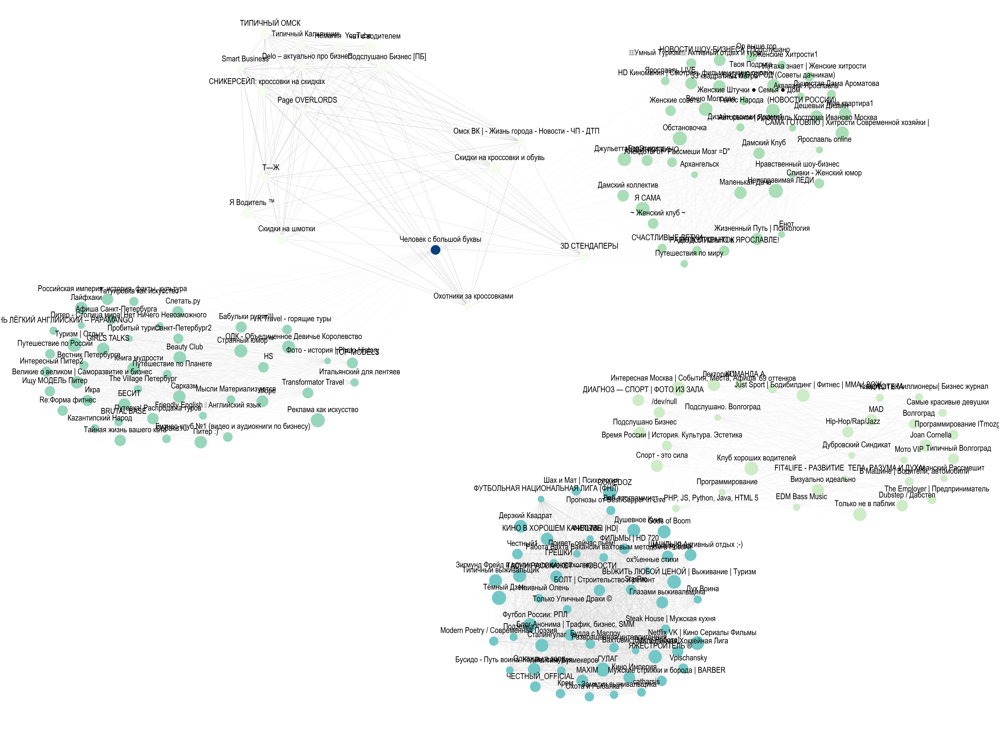

In [182]:
#figsize: width, height
#dpi default: 100
plt.figure(figsize=(120,90), facecolor='white')

#create the graph
g = nx.from_pandas_edgelist(nodes_,'name1', 'name2',
                            edge_attr='norm_weight',
                            create_using=nx.Graph())

#set nodes colors according to their degree
degrees = g.degree()      
nodes = g.nodes()
n_color = np.asarray([degrees[n] for n in nodes])


#create layout 
##k-скученность (больше число-больше расстояние между нодами)
##iterations-отдаленность кластеров
layout = nx.spring_layout(g, iterations=67, k=1) #k=0.35


#draw every node
carac = carac.reindex(g.nodes())
nx.draw_networkx_nodes(g, layout, 
                       nodelist=nodes,#carac.index, 
                       node_color=n_color,
                       cmap=plt.cm.GnBu, 
                       node_size=carac.norm_members_min_max * 9000)



#draw edges
frequency = [i['norm_weight']*2 for i in dict(g.edges).values()]
nx.draw_networkx_edges(g, layout, 
                       edge_color='#cccccc', 
                       width=frequency) #0.5


#draw labels
#raise text positions
for l in layout:  
    layout[l][0] += 0.01 #правее
    layout[l][1] += 0.03 #выше
    
nx.draw_networkx_labels(g,layout,
                        font_size=55,
                        font_family='Arial Narrow')

#turn off the axis
plt.axis('off')
plt.savefig('groups_graph.svg')
plt.show()

In [163]:
degrees_list = sorted(dict(degrees).items(), key=lambda item: item[1], reverse=True)
degrees_list[:15]

[('Человек с большой буквы', 86),
 ('Молодежная Хоккейная Лига', 52),
 ('Футбол России: РПЛ', 52),
 ('Vpischansky', 52),
 ('Наивный Олень', 52),
 ('Шах и Мат | Психология', 52),
 ('Тёмный Дзен', 52),
 ('Работа Вахта Вакансии вахтовым методом в России', 52),
 ('Вахтовик [Вахта-Работа]', 52),
 ('ФУТБОЛЬНАЯ НАЦИОНАЛЬНАЯ ЛИГА (ФНЛ)', 52),
 ('Честный1', 52),
 ('ЧЕСТНЫЙ_OFFICIAL', 52),
 ('Сталингулаг', 52),
 ('ГУЛАГ', 52),
 ('Душевное Кино', 52)]

### Центральность по степени (degree centrality)
Паблик с высоким значением degree_centrality чаще всего встречается вместе с остальными пабликами в подписках группы пользователей  
__degree_centrality__ тем выше, чем больше число связей вершины с другими вершинами в графе  
[центральности](http://asocialnetworks.blogspot.com/2016/02/python-networkx.html)

In [170]:
#compute the degree centrality & print 5 nodes with maximum degree centrality
dcent = nx.degree_centrality(g)
sorted(dcent.items(), key=lambda item: item[1], reverse=True)[:15]

[('Человек с большой буквы', 0.4574468085106383),
 ('Молодежная Хоккейная Лига', 0.2765957446808511),
 ('Футбол России: РПЛ', 0.2765957446808511),
 ('Vpischansky', 0.2765957446808511),
 ('Наивный Олень', 0.2765957446808511),
 ('Шах и Мат | Психология', 0.2765957446808511),
 ('Тёмный Дзен', 0.2765957446808511),
 ('Работа Вахта Вакансии вахтовым методом в России', 0.2765957446808511),
 ('Вахтовик [Вахта-Работа]', 0.2765957446808511),
 ('ФУТБОЛЬНАЯ НАЦИОНАЛЬНАЯ ЛИГА (ФНЛ)', 0.2765957446808511),
 ('Честный1', 0.2765957446808511),
 ('ЧЕСТНЫЙ_OFFICIAL', 0.2765957446808511),
 ('Сталингулаг', 0.2765957446808511),
 ('ГУЛАГ', 0.2765957446808511),
 ('Душевное Кино', 0.2765957446808511)]

### Центральность по посредничеству (betweenness centrality)
betweenness показывает, как часто пользователь подписывался на тот или иной паблик, "бродя" по другим тематическим пабликамю. Или на какой паблик чаще всего ссылаются (репостят записи) другие

In [165]:
#compute betweenness centrality
bcent = nx.betweenness_centrality(g)
sorted(bcent.items(), key=lambda item: item[1], reverse=True)[:5]

[('Человек с большой буквы', 0.10496074638752988),
 ('Клуб хороших водителей', 0.0),
 ('Спорт - это сила', 0.0),
 ('Dubstep / Дабстеп', 0.0),
 ('Программирование ITmozg:', 0.0)]

### Центральность по собственному вектору (eigenvector centrality)
мера оценки популярности паблика. Этот индекс может сказать нам, что, хотя некоторые паблики в сети имеют большое число связей, они не так важны, как другие с гораздо меньшим числом связей. В нашем случае паблики по eigenvector centrality и degree centrality совпадают

In [169]:
#print 5 nodes with maximum eigenvector centrality
eigcent = nx.eigenvector_centrality(g, max_iter=600)
sorted(eigcent.items(), key=lambda item: item[1], reverse=True)[:15]

[('Молодежная Хоккейная Лига', 0.13736056246455192),
 ('Футбол России: РПЛ', 0.13736056246455192),
 ('Vpischansky', 0.13736056246455192),
 ('Наивный Олень', 0.13736056246455192),
 ('Шах и Мат | Психология', 0.13736056246455192),
 ('Тёмный Дзен', 0.13736056246455192),
 ('Работа Вахта Вакансии вахтовым методом в России', 0.13736056246455192),
 ('Вахтовик [Вахта-Работа]', 0.13736056246455192),
 ('ФУТБОЛЬНАЯ НАЦИОНАЛЬНАЯ ЛИГА (ФНЛ)', 0.13736056246455192),
 ('Честный1', 0.13736056246455192),
 ('ЧЕСТНЫЙ_OFFICIAL', 0.13736056246455192),
 ('Сталингулаг', 0.13736056246455192),
 ('ГУЛАГ', 0.13736056246455192),
 ('Душевное Кино', 0.13736056246455192),
 ('Однажды в зале', 0.13736056246455192)]